In [62]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.animation as animation
import pandas as pd
import shapely
from shapely.geometry import Polygon
from shapely.geometry import Point
import geojson
import requests
from scipy.ndimage import convolve
from matplotlib.animation import FuncAnimation, FFMpegWriter


In [63]:
#process the TRI FACILITIES location and 


tri_df = pd.read_csv('2022_IL_TRI_DATA.csv')


tri_df['geometry'] = tri_df.apply(lambda row: Point(row['13. LONGITUDE'], row['12. LATITUDE']), axis=1)


tri_gdf = gpd.GeoDataFrame(tri_df, geometry='geometry')

tri_gdf.set_crs(epsg=4326, inplace=True) 

,1. YEAR,2. TRIFD,3. FRS ID,4. FACILITY NAME,5. STREET ADDRESS,6. CITY,7. COUNTY,8. ST,9. ZIP,10. BIA,...,111. 8.3 - ENERGY RECOVER OF,112. 8.4 - RECYCLING ON SITE,113. 8.5 - RECYCLING OFF SIT,114. 8.6 - TREATMENT ON SITE,115. 8.7 - TREATMENT OFF SITE,116. PRODUCTION WSTE (8.1-8.7),117. 8.8 - ONE-TIME RELEASE,118. PROD_RATIO_OR_ ACTIVITY,119. 8.9 - PRODUCTION RATIO,geometry
0,2022,6206WBNGBN395BI,110056955120,GREEN PLAINS MADISON LLC,395 BISSELL STREET,MADISON,MADISON,IL,62060,NaN,...,0.0,0.0,0.000000,0.0,0.0,0.000000e+00,0.0,NaN,0.00,POINT (-90.17185 38.67995)
1,2022,60434MBLJLINTER,110000595339,EXXONMOBIL OIL CORP JOLIET REFINERY,25915 S FRONTAGE RD,CHANNAHON,WILL,IL,60410,NaN,...,0.0,0.0,5.092004,0.0,0.0,1.033950e+02,NaN,PRODUCTION,1.02,POINT (-88.18346 41.41383)
2,2022,61607DDWRD7800S,110000438125,EDWARDS POWER STATION,7800 S CILCO LN,BARTONVILLE,PEORIA,IL,61607,NaN,...,0.0,0.0,0.000000,0.0,0.0,1.075401e+04,NaN,PRODUCTION,1.00,POINT (-89.66275 40.59562)
3,2022,62206CCDNT500MO,110000500486,OCCIDENTAL CHEMICAL CORP SAUGET PLANT,520 MONSANTO AVE,SAUGET,ST. CLAIR,IL,62206,NaN,...,0.0,451000.0,0.000000,797000.0,0.0,1.254080e+06,NaN,PRODUCTION,0.90,POINT (-90.16993 38.60001)
4,2022,62201TRDWS7MOBI,110000438893,VEOLIA N.A. INC.,7 MOBILE AVE,SAUGET,ST. CLAIR,IL,62201,NaN,...,0.0,0.0,0.000000,0.0,55469.0,5.548511e+04,NaN,NaN,NaN,POINT (-90.18063 38.59803)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3606,2022,60064THGLL3500W,110000429821,THE GILLETTE CO. LLC/P&G NORTH CHICAGO PLANT,3500 W 16TH ST,NORTH CHICAGO,LAKE,IL,60064,NaN,...,0.0,0.0,0.000000,0.0,0.0,0.000000e+00,0.0,NaN,0.00,POINT (-87.87897 42.33175)
3607,2022,60064THGLL3500W,110000429821,THE GILLETTE CO. LLC/P&G NORTH CHICAGO PLANT,3500 W 16TH ST,NORTH CHICAGO,LAKE,IL,60064,NaN,...,0.0,0.0,0.000000,0.0,0.0,1.320000e+02,NaN,PRODUCTION,1.06,POINT (-87.87897 42.33175)
3608,2022,60443CHRDW21901,110002463183,SHERWIN-WILLIAMS CO,21901 CENTRAL AVE,MATTESON,COOK,IL,60443,NaN,...,0.0,0.0,0.000000,0.0,0.0,0.000000e+00,0.0,NaN,0.00,POINT (-87.74718 41.49355)
3609,2022,60473MCWHR192W1,110014401067,ACCURATE DISPERSIONS,192 W 155TH ST,SOUTH HOLLAND,COOK,IL,60473,NaN,...,498.0,0.0,82.000000,2.0,623.0,1.235000e+03,NaN,PRODUCTION,1.15,POINT (-87.62182 41.61428)


In [64]:
columns_to_keep = ['2. TRIFD', '12. LATITUDE', '13. LONGITUDE', '20. INDUSTRY SECTOR', '43. CARCINOGEN', '49. 5.2 - STACK AIR', 'geometry']
new_tri_gdf = tri_gdf[columns_to_keep]

new_tri_gdf = new_tri_gdf.rename(columns={
    '2. TRIFD': 'TRIFD',
    '12. LATITUDE': 'Latitude',
    '13. LONGITUDE': 'Longitude',
    '20. INDUSTRY SECTOR': 'Industry',
    '43. CARCINOGEN': 'Carcinogen',
    '49. 5.2 - STACK AIR': 'Stack Air'
})

In [65]:
# OpenWeatherMap API Key
API_KEY = 'bd5e378503939ddaee76f12ad7a97608' 

# Function to get wind speed and direction based on latitude and longitude
def get_wind_data(lat, lon,idx):
    print("wind data for idx:"+str(idx))
    url = f"http://api.openweathermap.org/data/2.5/weather?lat={lat}&lon={lon}&appid={API_KEY}&units=metric"
    
    response = requests.get(url)
    
    data = response.json()
    
    if response.status_code == 200:
        # Extract wind speed and direction
        wind_speed = data['wind']['speed']
        wind_direction = data['wind']['deg']
        print(f"Wind Speed: {wind_speed} m/s, Wind Direction: {wind_direction} degrees")
        return wind_speed, wind_direction
    else:
        print("Error:", data.get("message", "Failed to retrieve data"))
        return None

In [66]:

lat, lon = 41.8781, -87.6298  # Coordinates for Chicago

wind_speed, wind_direction = get_wind_data(lat, lon,0)

print(f"Wind speed: {wind_speed} m/s, Wind direction: {wind_direction} degrees")

wind data for idx:0
Wind Speed: 3.6 m/s, Wind Direction: 250 degrees
Wind speed: 3.6 m/s, Wind direction: 250 degrees


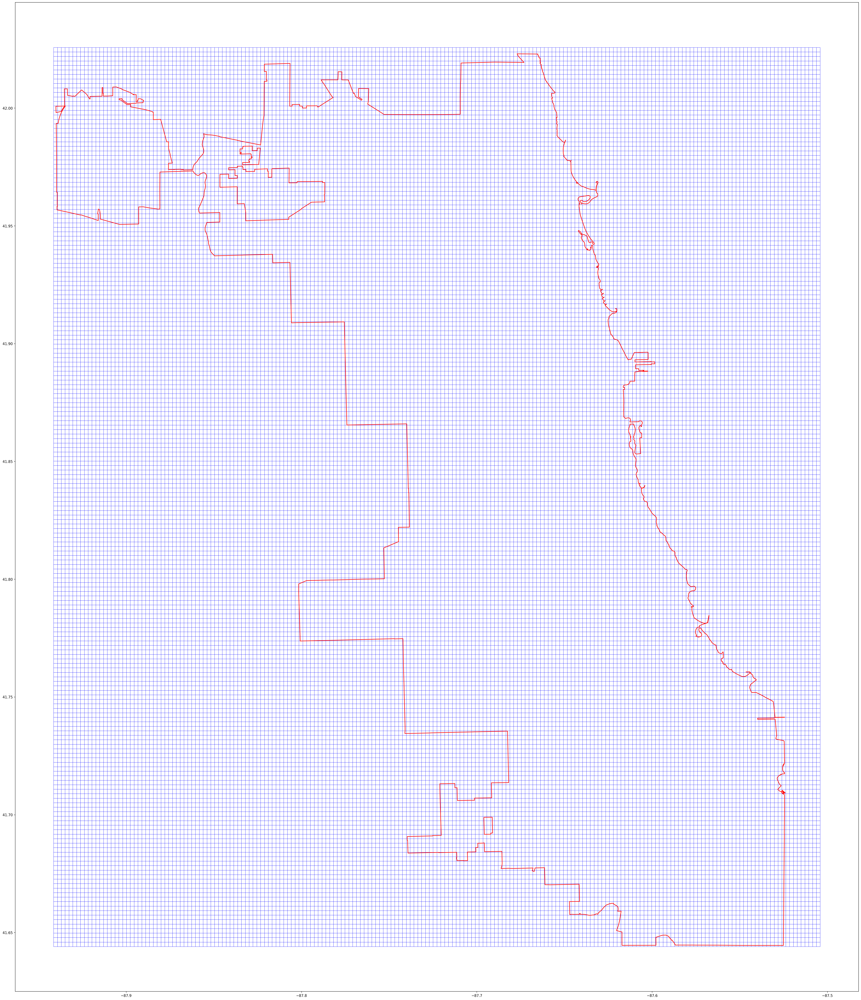

In [67]:
geojson_file = 'Chicago_grid_200x200.geojson'
gdf = gpd.read_file(geojson_file)


geojson_file2 = 'Boundaries-Chicago.geojson'
gdf2 = gpd.read_file(geojson_file2)

fig, ax = plt.subplots(figsize=(50, 50))
plt.cla()

gdf.plot(ax=ax, edgecolor='blue', linewidth=0.5, facecolor='white')
gdf2.plot(ax=ax, edgecolor='red', linewidth=1.5, facecolor='none')

plt.show()


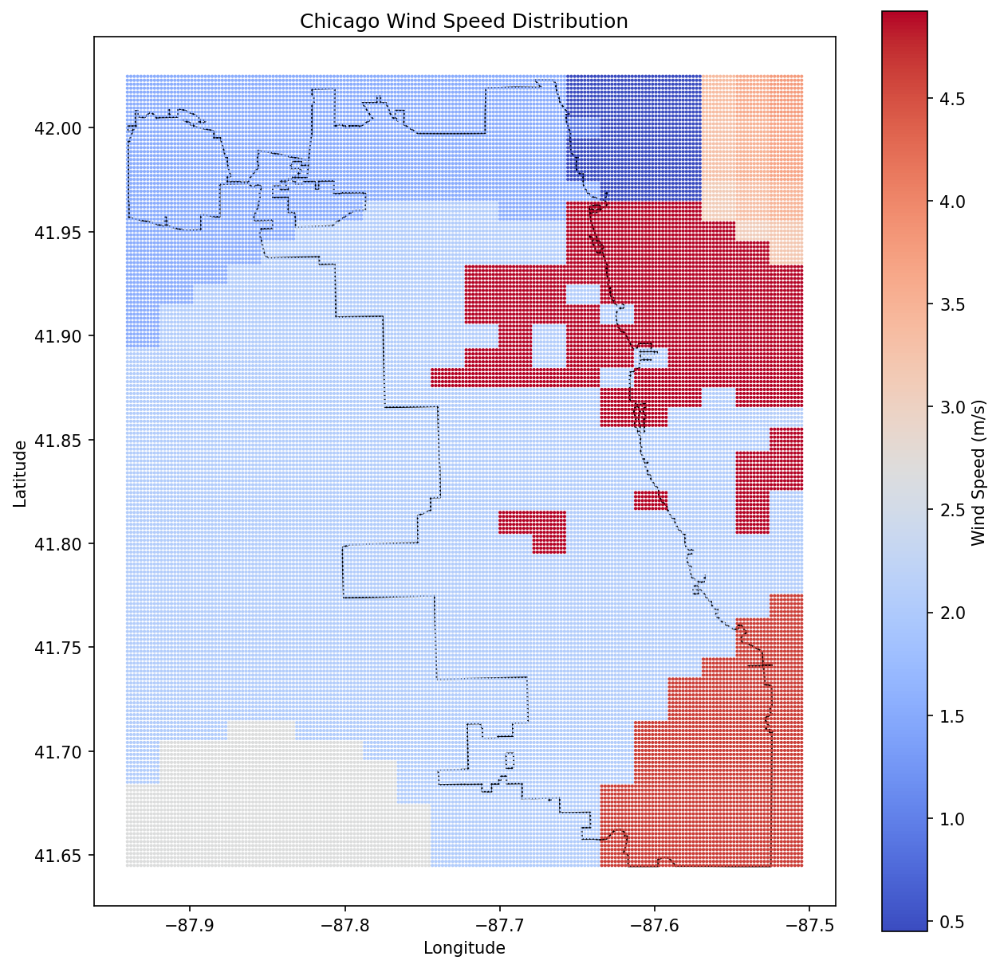

In [68]:
# Load the Chicago boundaries and wind data from GeoJSON files
chicago_boundary = gpd.read_file("Boundaries-Chicago.geojson")
wind_data = gpd.read_file("wind_Chicago.geojson")

chicago_boundary = chicago_boundary.to_crs(epsg=4326)
wind_data = wind_data.to_crs(epsg=4326)

wind_data['lon'] = wind_data.geometry.x
wind_data['lat'] = wind_data.geometry.y
wind_speed = wind_data['wind_speed']

fig, ax = plt.subplots(figsize=(10, 10))
chicago_boundary.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1)

scatter = ax.scatter(wind_data['lon'], wind_data['lat'], c=wind_speed, cmap='coolwarm', s=1)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Wind Speed (m/s)')

plt.title("Chicago Wind Speed Distribution")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()

In [69]:
#filter TRI facilties inside 

chicago_tri_gdf = new_tri_gdf[new_tri_gdf.geometry.within(chicago_boundary.unary_union)]
#print(chicago_tri_gdf)

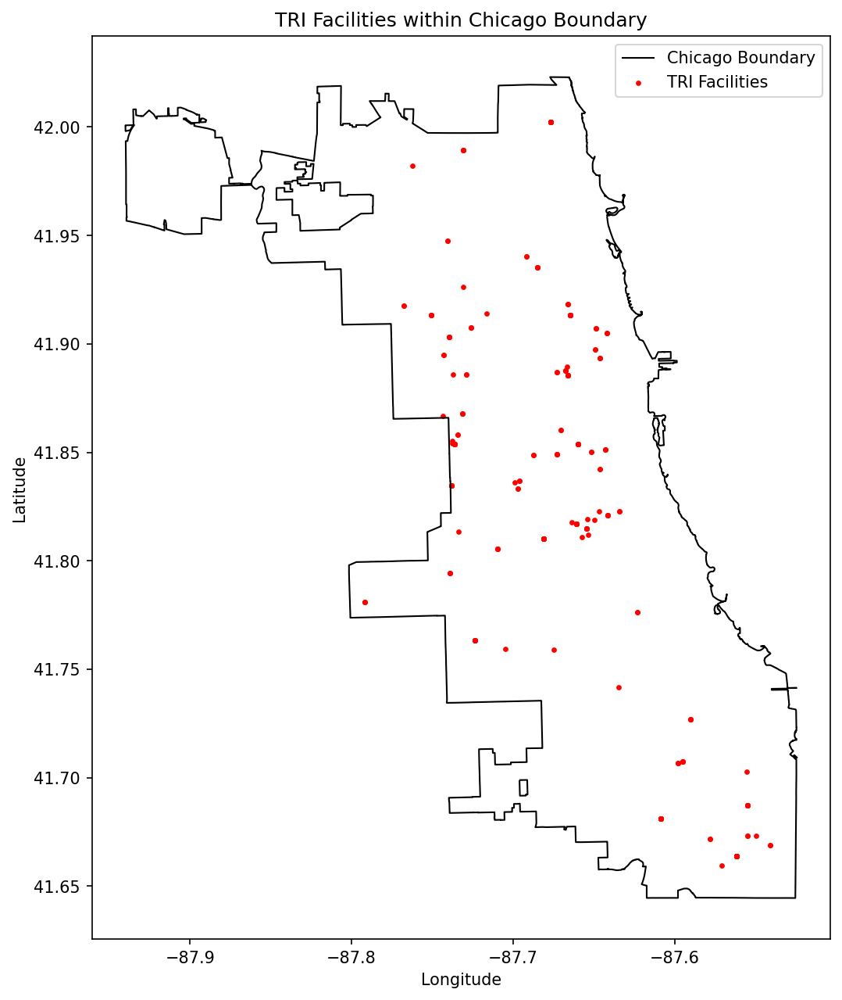

In [70]:

fig, ax = plt.subplots(figsize=(10, 10))


chicago_boundary.boundary.plot(ax=ax, color='black', linewidth=1, label='Chicago Boundary')


chicago_tri_gdf.plot(ax=ax, marker='o', color='red', markersize=5, label='TRI Facilities')


plt.legend()
plt.title("TRI Facilities within Chicago Boundary")
plt.xlabel("Longitude")
plt.ylabel("Latitude")


plt.show()

In [71]:
print(wind_data)

wind_data = wind_data.sort_values(by='lat', ascending=False)

sorted_chunks = []

chunk_size = 200

for i in range(0, len(wind_data), chunk_size):
    chunk = wind_data.iloc[i:i + chunk_size]
    chunk_sorted = chunk.sort_values(by='lon', ascending=True)
    sorted_chunks.append(chunk_sorted)

wind_data_sorted = pd.concat(sorted_chunks)

wind_data = wind_data_sorted


# Assign incremental IDs starting from 1
wind_data['cell_id'] = range(1, len(wind_data) + 1)

wind_data = wind_data.drop(columns=['lat', 'lon'])
wind_data = wind_data.reset_index(drop=True)

       cell_id  wind_speed  wind_direction                    geometry  \
0            1        1.54           170.0  POINT (-87.94033 42.02480)   
1            2        1.54           170.0  POINT (-87.93814 42.02480)   
2            3        1.54           170.0  POINT (-87.93596 42.02480)   
3            4        1.54           170.0  POINT (-87.93377 42.02480)   
4            5        1.54           170.0  POINT (-87.93158 42.02480)   
...        ...         ...             ...                         ...   
39995    39996        4.63           350.0  POINT (-87.51400 41.64503)   
39996    39997        4.63           350.0  POINT (-87.51182 41.64503)   
39997    39998        4.63           350.0  POINT (-87.50963 41.64503)   
39998    39999        4.63           350.0  POINT (-87.50744 41.64503)   
39999    40000        4.63           350.0  POINT (-87.50526 41.64503)   

             lon        lat  
0     -87.940329  42.024802  
1     -87.938142  42.024802  
2     -87.935956  42.

In [72]:

grid_size = (200, 200)

wind_data_grid = np.zeros((grid_size[0], grid_size[1], 2))

for idx, row in wind_data.iterrows():
    
    i = idx // grid_size[1]  
    j = idx % grid_size[1]  
    
    wind_speed = row['wind_speed']
    wind_direction = row['wind_direction']
    
    wind_data_grid[i, j] = (wind_speed, wind_direction)


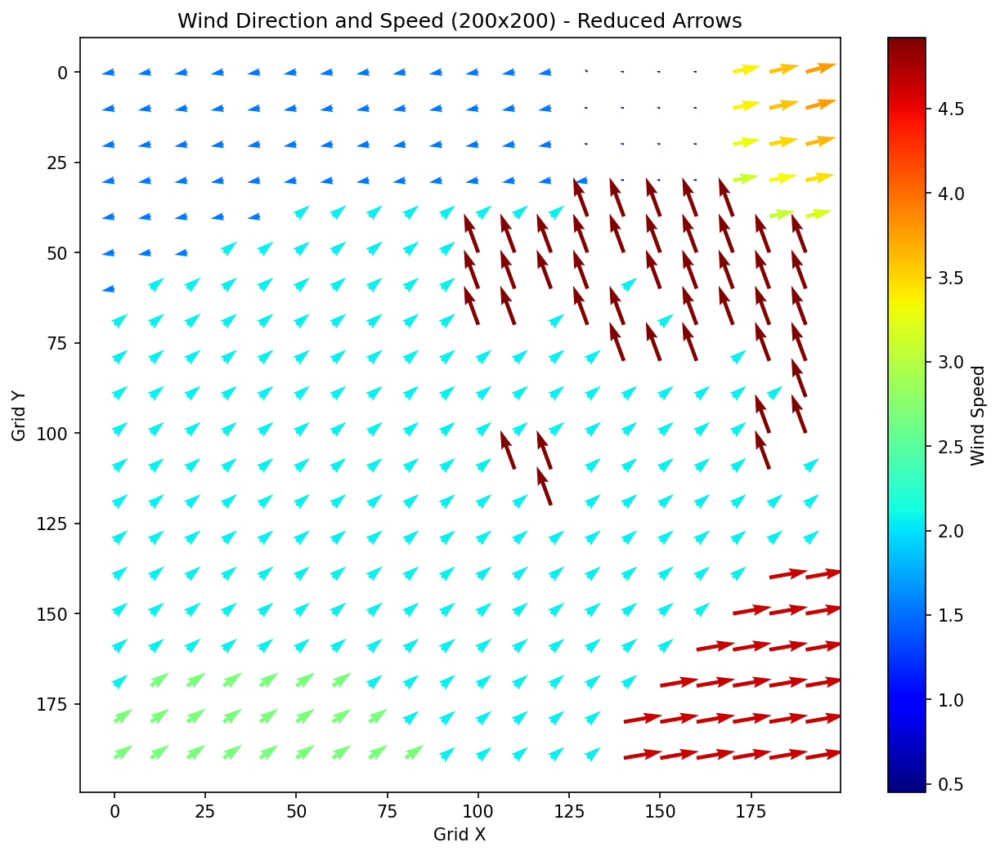

In [73]:

x = np.arange(0, wind_data_grid.shape[1])
y = np.arange(0, wind_data_grid.shape[0])
X, Y = np.meshgrid(x, y)

wind_speed_grid = wind_data_grid[:, :, 0]
wind_direction_grid = wind_data_grid[:, :, 1]

wind_direction_radians = np.deg2rad(wind_direction_grid)

U = wind_speed_grid * np.cos(wind_direction_radians)
V = wind_speed_grid * np.sin(wind_direction_radians)

subsample_rate = 10

X_sub = X[::subsample_rate, ::subsample_rate]
Y_sub = Y[::subsample_rate, ::subsample_rate]
U_sub = U[::subsample_rate, ::subsample_rate]
V_sub = V[::subsample_rate, ::subsample_rate]
wind_speed_sub = wind_speed_grid[::subsample_rate, ::subsample_rate]

arrow_width = 0.005

plt.figure(figsize=(10, 8))
plt.quiver(X_sub, Y_sub, U_sub, V_sub, wind_speed_sub, angles='xy', scale_units='xy',  width=arrow_width, cmap='jet')
plt.colorbar(label='Wind Speed')
plt.title('Wind Direction and Speed (200x200) - Reduced Arrows')
plt.xlabel('Grid X')
plt.ylabel('Grid Y')
plt.gca().invert_yaxis()

#plt.show()


Text(0.5, 1.0, 'Cell IDs Visualized with Jet Colormap (Top-Left to Bottom-Right)')

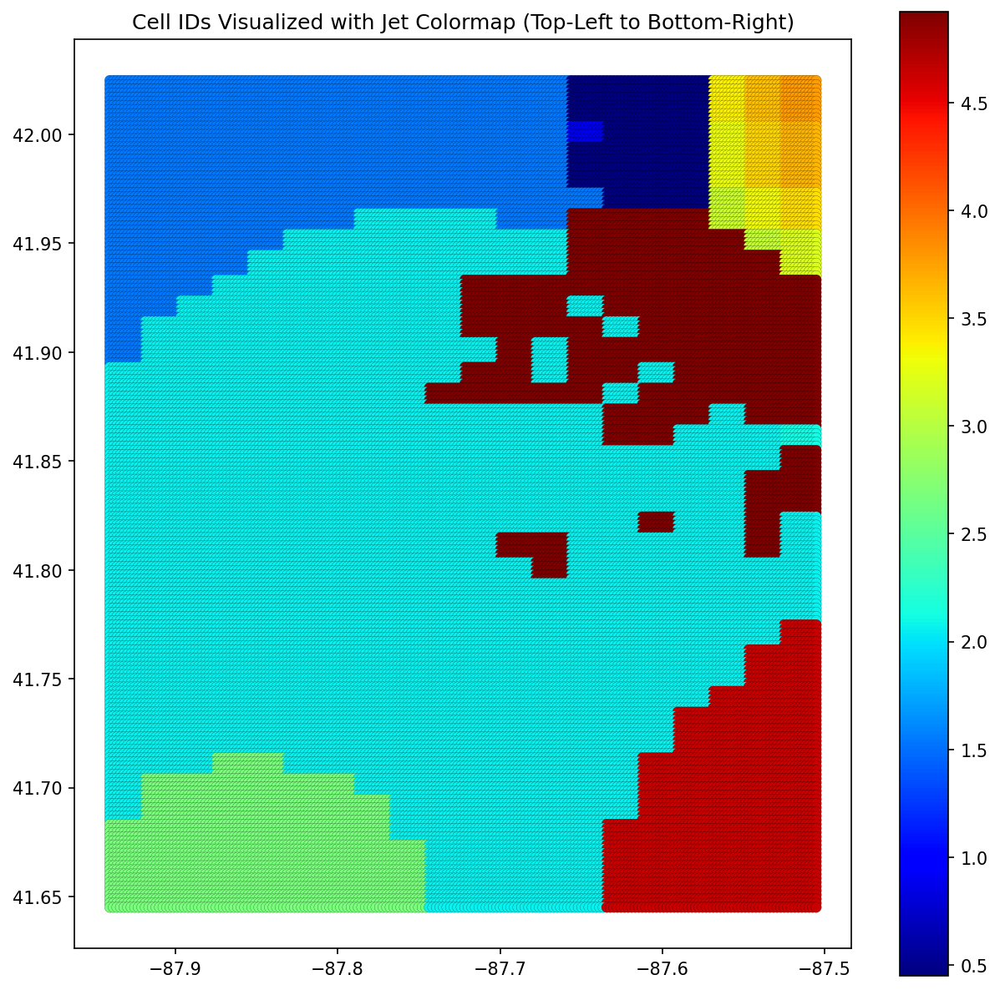

In [74]:

fig, ax = plt.subplots(figsize=(10, 10))
wind_data.plot(ax=ax, column='wind_speed', cmap='jet', legend=True, edgecolor='black', linewidth=0.1)

ax.set_title('Cell IDs Visualized with Jet Colormap (Top-Left to Bottom-Right)')
#plt.show()

In [75]:
gdf = gdf.to_crs(epsg=3857)

gdf['centroid'] = gdf.geometry.centroid

gdf['latitude'] = gdf.centroid.y
gdf['longitude'] = gdf.centroid.x

# Sort by latitude in decreasing order
gdf = gdf.sort_values(by='latitude', ascending=False)

sorted_chunks = []

chunk_size = 200

for i in range(0, len(gdf), chunk_size):
    chunk = gdf.iloc[i:i + chunk_size]
    chunk_sorted = chunk.sort_values(by='longitude', ascending=True)
    sorted_chunks.append(chunk_sorted)


gdf_sorted = pd.concat(sorted_chunks)

gdf = gdf_sorted


# Assign incremental IDs starting from 1
gdf['cell_id'] = range(1, len(gdf) + 1)

gdf = gdf.drop(columns=['latitude', 'longitude'])
gdf = gdf.reset_index(drop=True)

gdf = gdf.to_crs(epsg=4326)

In [76]:
def calculate_grid_indices_from_id(gdf, n_rows=200, n_cols=200):
    # Calculate row_index and col_index based on the 'cell_id' column
    for idx, row in gdf.iterrows():
        row_index = (row['cell_id'] - 1) // n_cols 
        col_index = (row['cell_id'] - 1) % n_cols 

        print(f"Polygon {idx}: cell_id = {row['cell_id']}, row_index = {row_index}, col_index = {col_index}")

        gdf.at[idx, 'row_index'] = row_index
        gdf.at[idx, 'col_index'] = col_index

    gdf['total_index'] = gdf['col_index'] + gdf['row_index']

    return gdf

In [77]:
gdf = calculate_grid_indices_from_id(gdf, n_rows=200, n_cols=200)

Polygon 0: cell_id = 1, row_index = 0, col_index = 0
Polygon 1: cell_id = 2, row_index = 0, col_index = 1
Polygon 2: cell_id = 3, row_index = 0, col_index = 2
Polygon 3: cell_id = 4, row_index = 0, col_index = 3
Polygon 4: cell_id = 5, row_index = 0, col_index = 4
Polygon 5: cell_id = 6, row_index = 0, col_index = 5
Polygon 6: cell_id = 7, row_index = 0, col_index = 6
Polygon 7: cell_id = 8, row_index = 0, col_index = 7
Polygon 8: cell_id = 9, row_index = 0, col_index = 8
Polygon 9: cell_id = 10, row_index = 0, col_index = 9
Polygon 10: cell_id = 11, row_index = 0, col_index = 10
Polygon 11: cell_id = 12, row_index = 0, col_index = 11
Polygon 12: cell_id = 13, row_index = 0, col_index = 12
Polygon 13: cell_id = 14, row_index = 0, col_index = 13
Polygon 14: cell_id = 15, row_index = 0, col_index = 14
Polygon 15: cell_id = 16, row_index = 0, col_index = 15
Polygon 16: cell_id = 17, row_index = 0, col_index = 16
Polygon 17: cell_id = 18, row_index = 0, col_index = 17
Polygon 18: cell_id =

In [78]:
#add TRI facilties to the gdf 
gdf['contains_point'] = 0

for index, row in gdf.iterrows():
    print(f"Checking polygon index: {index}")
    if chicago_tri_gdf.geometry.apply(lambda point: row.geometry.contains(point)).any():
        gdf.at[index, 'contains_point'] = 1  # Mark as 1 if any point is contained

Checking polygon index: 0
Checking polygon index: 1
Checking polygon index: 2
Checking polygon index: 3
Checking polygon index: 4
Checking polygon index: 5
Checking polygon index: 6
Checking polygon index: 7
Checking polygon index: 8
Checking polygon index: 9
Checking polygon index: 10
Checking polygon index: 11
Checking polygon index: 12
Checking polygon index: 13
Checking polygon index: 14
Checking polygon index: 15
Checking polygon index: 16
Checking polygon index: 17
Checking polygon index: 18
Checking polygon index: 19
Checking polygon index: 20
Checking polygon index: 21
Checking polygon index: 22
Checking polygon index: 23
Checking polygon index: 24
Checking polygon index: 25
Checking polygon index: 26
Checking polygon index: 27
Checking polygon index: 28
Checking polygon index: 29
Checking polygon index: 30
Checking polygon index: 31
Checking polygon index: 32
Checking polygon index: 33
Checking polygon index: 34
Checking polygon index: 35
Checking polygon index: 36
Checking po

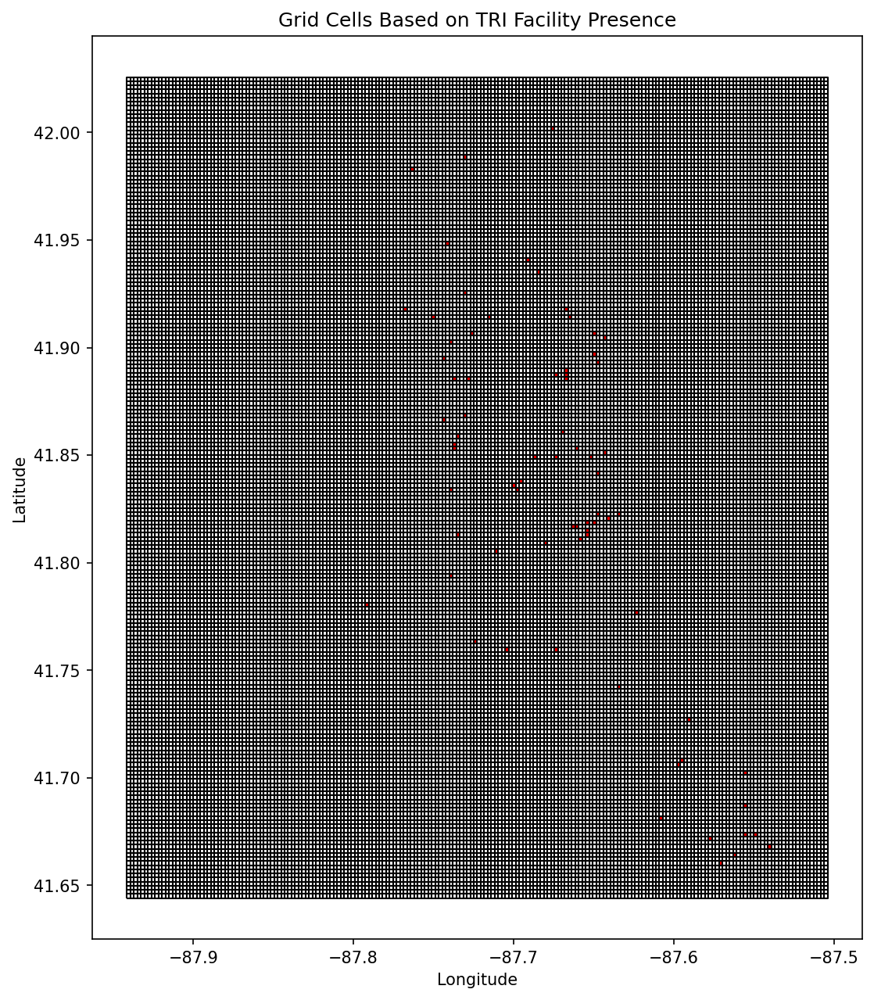

In [79]:

fig, ax = plt.subplots(figsize=(10, 10))

gdf['color'] = gdf['contains_point'].apply(lambda x: 'red' if x == 1 else 'white')

gdf.plot(color=gdf['color'], ax=ax, edgecolor='black')

plt.title('Grid Cells Based on TRI Facility Presence')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

In [80]:
%matplotlib inline

In [81]:
print(wind_speed_grid)
max_wind_speed = np.max(wind_speed_grid)
print(max_wind_speed)

[[1.54 1.54 1.54 ... 3.78 3.78 3.78]
 [1.54 1.54 1.54 ... 3.78 3.78 3.78]
 [1.54 1.54 1.54 ... 3.78 3.78 3.78]
 ...
 [2.68 2.68 2.68 ... 4.63 4.63 4.63]
 [2.68 2.68 2.68 ... 4.63 4.63 4.63]
 [2.68 2.68 2.68 ... 4.63 4.63 4.63]]
4.92


In [82]:
diffusion_kernel = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]
])


In [83]:

def update_grid(grid):
    new_grid = np.copy(grid)

    # Random diffusion rates
    diffusion_grid = np.clip(np.random.normal(diffusion_rate_mean, diffusion_variability, grid_size), 0, 1)
    
    # Random dissipation rates
    dissipation_grid = np.clip(np.random.normal(dissipation_rate_mean, dissipation_variability, grid_size), 0, 1)


    # Apply diffusion using 2D convolution with the kernel
    diffusion_effect = convolve(grid, diffusion_kernel, mode='constant', cval=0.0)
    new_grid += diffusion_grid * diffusion_effect

    # Integrate wind influence
    for i in range(1, grid_size[0] - 1):
        for j in range(1, grid_size[1] - 1):
            wind_speed, wind_direction = wind_data_grid[i, j]

            normalized_wind_speed = wind_speed / max_wind_speed
            wind_direction_radians = np.deg2rad(wind_direction)
            wind_x = normalized_wind_speed * np.cos(wind_direction_radians)
            wind_y = normalized_wind_speed * np.sin(wind_direction_radians)
            
            if wind_x != 0:
                new_grid[i, j] -= wind_x * grid[i, j] 
                new_grid[i, j + int(np.sign(wind_x))] += wind_x * grid[i, j]  # Move smoke to adjacent cell
            if wind_y != 0:
                new_grid[i, j] -= wind_y * grid[i, j] 
                new_grid[i + int(np.sign(wind_y)), j] += wind_y * grid[i, j]  # Move smoke to adjacent cell
    
    # Apply dissipation
    new_grid *= (1 - dissipation_grid)

    # Ensure non-negative smoke density
    new_grid = np.maximum(new_grid, 0)

    return new_grid


In [84]:
def apply_special_colormap(grid):
    cmap = plt.get_cmap('jet')
    
    normalized_grid = grid / np.max(grid)
    colored_grid = cmap(normalized_grid)  
    colored_grid[grid < 0.0000008] = [1, 1, 1, 1]
    return colored_grid

In [85]:
release_smoke_x_y_values = []

In [86]:
def release_smoke(grid):

    for (x, y) in release_smoke_x_y_values:
        grid[int(x), int(y)] += release_rate
        
    print(f"Smoke updated for {len(release_smoke_x_y_values)} values.")
    return grid

In [87]:

def add_wind_date_to_gdf():
    for idx, row in gdf.iterrows():
        row_index = int(row['row_index'])
        col_index = int(row['col_index'])
        smoke_density = grid[row_index, col_index]
        color_smoke_density = colored_grid[row_index, col_index]
        gdf.at[idx, 'smoke_density'] = smoke_density


    return gdf

In [88]:

def update_smoke_density_in_gdf(grid, gdf):
    for idx, row in gdf.iterrows():
        row_index = int(row['row_index'])
        col_index = int(row['col_index'])
        smoke_density = grid[row_index, col_index]
        color_smoke_density = colored_grid[row_index, col_index]
        gdf.at[idx, 'smoke_density'] = smoke_density


    return gdf


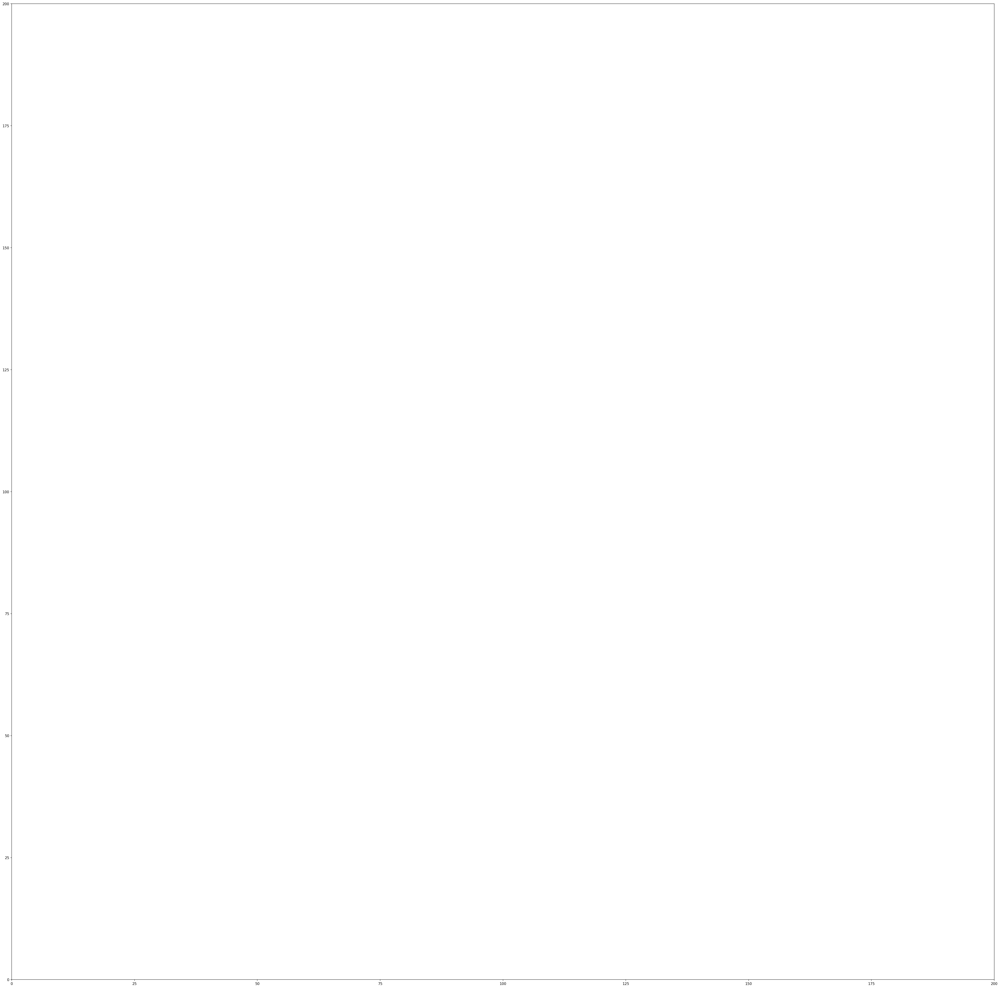

In [89]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150   
plt.rcParams['animation.embed_limit'] = 50 
fig, ax = plt.subplots(figsize=(50, 50))
ax.set_xlim(0, grid_size[1])
ax.set_ylim(0, grid_size[0])

def animate(t):

    global grid
    global colored_grid
    global gdf

    gdf = update_smoke_density_in_gdf(grid, gdf)

    ax.clear()


    
    print(f"visualizing step: {t+1}/{num_steps}", end='\r')

    gdf.plot(ax=ax, edgecolor='black', linewidth=0.01, facecolor='white')
    mask = gdf['smoke_density'] >= 0.00008
    gdf[mask].plot(ax=ax, column='smoke_density', cmap='jet', legend=False)
    gdf[~mask].plot(ax=ax, edgecolor='black', linewidth=0.1, facecolor='white')
    gdf2.plot(ax=ax, edgecolor='red', linewidth=0.5, facecolor='none')


    grid = release_smoke(grid)
    grid = update_grid(grid)





In [90]:

gdf['row_index'] = gdf['row_index'].astype(int)
gdf['col_index'] = gdf['col_index'].astype(int)

gdf['wind_speed'] = wind_speed_grid[gdf['row_index'], gdf['col_index']]


In [91]:
grid_size = (200, 200)

diffusion_rate_mean = 0.01  # How fast smoke diffuses
diffusion_variability = 0.5
dissipation_rate_mean = 0.1  # How fast smoke fades 
dissipation_variability = 0.1
release_rate = 1.0
release_smoke_x_y_values = []
'''
diffusion_rate_mean = 0.01  # How fast smoke diffuses
diffusion_variability = 0.5
dissipation_rate_mean = 0.03  # How fast smoke fades 
dissipation_variability = 0.1
release_rate = 2

'''
num_steps = 10  # Number of steps in the simulation
interval_steps = 1

grid = np.zeros(grid_size)
cmap = plt.get_cmap('jet')
colored_grid = cmap(grid / 1.0)




for index, row in gdf.iterrows():
    if row['contains_point'] == 1:
        grid[int(row['row_index']), int(row['col_index'])] = 1
        release_smoke_x_y_values.append((row['row_index'], row['col_index']))    


In [92]:

matplotlib.animation.FuncAnimation(fig, animate, frames=num_steps,interval=500, blit=False)



Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.
Smoke updated for 73 values.


<Figure size 960x720 with 0 Axes>

In [93]:
gdf = gdf.drop(columns=['centroid'])
gdf.to_file("smokeSimFinal.geojson", driver="GeoJSON")
print(gdf)

                                                geometry  cell_id  row_index  \
0      POLYGON ((-87.94142 42.02385, -87.93924 42.023...        1          0   
1      POLYGON ((-87.93924 42.02385, -87.93705 42.023...        2          0   
2      POLYGON ((-87.93705 42.02385, -87.93486 42.023...        3          0   
3      POLYGON ((-87.93486 42.02385, -87.93268 42.023...        4          0   
4      POLYGON ((-87.93268 42.02385, -87.93049 42.023...        5          0   
...                                                  ...      ...        ...   
39995  POLYGON ((-87.51510 41.64407, -87.51291 41.644...    39996        199   
39996  POLYGON ((-87.51291 41.64407, -87.51072 41.644...    39997        199   
39997  POLYGON ((-87.51072 41.64407, -87.50854 41.644...    39998        199   
39998  POLYGON ((-87.50854 41.64407, -87.50635 41.644...    39999        199   
39999  POLYGON ((-87.50635 41.64407, -87.50416 41.644...    40000        199   

       col_index  total_index  contains